# Random Forest: PCA on All Samples Matrix

RE:PCA - I think the goal here would be to calculate a PCA on the entire data-set (i.e. all of the simulations in one big data frame) and for each simulation calculate its particular value for the PCs we'll focus on. I haven't had my coffee yet so apologies if this is convoluted -  Each PC will have loadings based on each of the features, so you would then calculate equivalent PC values for the validation/testing set by applying those same loadings, even if they are not technically *the* PC of the testing set. Does that make sense? 

In [1]:
# library preparations
import scipy.io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import joblib
import seaborn as sns
import time

In [2]:
load_train = np.load('./data/train.npz', allow_pickle=True)
load_test = np.load('./data/test_large.npz', allow_pickle=True)
X_train, y_train = load_train['X_train'], load_train['y_train']
X_test, y_test = load_test['X_test_large'], load_test['y_test_large']

samples, rows, cols = X_train.shape
print("Before flattening:")
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

Before flattening:
(6500, 460, 12)
(6500, 1)
(6499, 460, 12)
(6499, 1)


In [3]:
y_train = y_train.reshape(y_train.shape[0], )
y_test = y_test.reshape(y_test.shape[0], )
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)

print("After flattening:")
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

After flattening:
(6500, 5520)
(6500,)
(6499, 5520)
(6499,)


Variance explained in PCs [0.035 0.029 0.025 ... 0.    0.    0.   ]
Need 549 principal components to meet 0.8


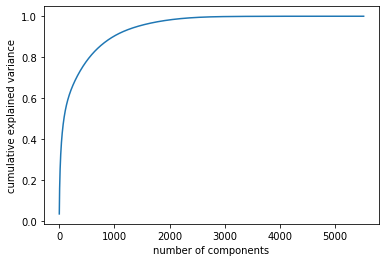

In [4]:
from sklearn.decomposition import PCA
from random import randrange
from sklearn.preprocessing import scale

# dimensionality reduction on whole dataset
pca = PCA()
pcs = pca.fit_transform(scale(X_train))
varprop = pca.explained_variance_ratio_
# num_pc = pca.n_components_
num_pc = 20

print("Variance explained in PCs", varprop.round(3))
# print("Eigen vectors", pca.components_)

# Take as many principal components as necessary to explain
# threshold amount of variation
threshold = 0.8
keep = np.argwhere(np.cumsum(varprop) > threshold)[0, 0]
print(f"Need {keep} principal components to meet {threshold}")

%matplotlib inline
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [5]:
loadings = pca.components_.T
columns_names = ["PC" + str(i) for i in range(0, 10)]
pd.DataFrame(loadings[:, :10], columns=columns_names)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,-0.000545,-0.001598,-0.001629,-0.003811,-0.001789,0.000359,-0.000451,0.002779,-0.003513,0.000464
1,-0.001499,-0.008564,-0.005750,-0.017323,-0.011884,-0.010880,-0.001494,0.007721,-0.015751,0.004310
2,0.001402,-0.000099,0.003568,0.002173,-0.001494,-0.004317,-0.006478,-0.002801,-0.005720,0.007757
3,0.001809,0.005032,0.005477,0.011921,0.006387,0.003585,-0.002457,-0.006931,0.007300,0.001389
4,0.001700,0.003358,0.005072,0.008687,0.003551,0.000567,-0.004124,-0.005498,0.002249,0.004068
...,...,...,...,...,...,...,...,...,...,...
5515,0.006251,0.003631,-0.012226,-0.002057,-0.009200,0.004844,-0.008949,0.006805,0.009689,0.012453
5516,0.003648,0.004337,-0.010745,0.001625,-0.009962,0.008966,-0.014749,0.012098,0.009719,0.020248
5517,-0.007387,0.008467,-0.001480,0.009010,-0.001224,0.010232,-0.008528,0.004520,0.012941,0.007844
5518,-0.007480,0.011723,0.000205,0.016031,0.003541,0.015524,-0.007548,0.006195,0.020364,0.004093


In [6]:
# Prepare for K fold cross validation
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import precision_score, recall_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

k = 10
keep_pc = 600 # arbitrary
# again, random_state for sake of reproducibility
kf = KFold(n_splits=k, random_state = 42, shuffle=True)

# default confusion matrix 
# we can calculate TP, FP, FN, TN from this matrix at the end
matrix = pd.DataFrame(0, index=['True Yes', 'True No', ''], 
                      columns=['Pred Yes', 'Pred No', ''])
pca = PCA()

start = time.time()
AUCs = []
for train_index, test_index in kf.split(X_train):
    # identify the train and test set within each fold
    X_fold_train, X_fold_test = X_train[train_index], X_train[test_index]
    y_fold_train, y_fold_test = y_train[train_index], y_train[test_index]
    
    # fit the model on the training set after PCA reductions
    X_fold_train_reduced = pca.fit_transform(scale(X_fold_train))[:, :keep_pc]
    loadings = pca.components_.T
    model = RandomForestClassifier(n_estimators=500, oob_score=True,
                                   max_features = 'sqrt', n_jobs=8)
    model.fit(X_fold_train_reduced, y_fold_train)

    # predict label on validation test set, record results
    # validation test set is reduced using loadings from training data
    X_fold_test_reduced = np.matmul(scale(X_fold_test), loadings)[:, :keep_pc]
    y_pred = model.predict(X_fold_test_reduced)
    y_prob = model.predict_proba(X_fold_test_reduced)[:,1]

    # collect metrics
    m = pd.crosstab(y_pred, y_fold_test, margins=True)
    m.index = ['True Yes', 'True No', '']
    m.columns = ['Pred Yes', 'Pred No', '']
    matrix += m
    
    pred_prob = model.predict_proba(X_fold_test_reduced)[:, 1]
    AUCs.append(roc_auc_score(y_fold_test, pred_prob))

end = time.time()
print('Time taken:', end - start)
print(matrix)
TP, FN = matrix.iloc[0, 0], matrix.iloc[0, 1]
FP, TN = matrix.iloc[1, 0], matrix.iloc[1, 1]
total = TP + FN + FP + TN
print("Accuracy: \t\t\t\t\t\t\t", (TP + TN) / total)
print("Error Rate: \t\t\t\t\t\t\t", (FN + FP) / total)
recall = TP / (TP + FN)
print("True Positive Rate (TPR) | Sensitivity | Recall | Coverage\t", recall)
print("True Negative Rate (TNR) | Specificity \t\t\t\t", 
      TN / (FP + TN))
print("False Positive Rate (FPR) is \t\t\t\t\t", FP / (FP + TN))
print("False Negative Rate (FNR) is \t\t\t\t\t", FN / (TP + FN))
precision = TP / (TP + FP)
print("Average Precision: \t\t\t\t\t\t", precision)
print("Average Recall: \t\t\t\t\t\t", recall)
print("Average F Measures: \t\t\t\t\t\t", 
      (2*precision*recall) / (precision+recall))
print("Average AUC: \t\t\t\t\t\t\t", np.mean(AUCs))

Time taken: 363.7455632686615
          Pred Yes  Pred No      
True Yes       580       23   603
True No       1865     4032  5897
              2445     4055  6500
Accuracy: 							 0.7095384615384616
Error Rate: 							 0.29046153846153844
True Positive Rate (TPR) | Sensitivity | Recall | Coverage	 0.9618573797678275
True Negative Rate (TNR) | Specificity 				 0.6837374936408344
False Positive Rate (FPR) is 					 0.3162625063591657
False Negative Rate (FNR) is 					 0.03814262023217247
Average Precision: 						 0.23721881390593047
Average Recall: 						 0.9618573797678275
Average F Measures: 						 0.3805774278215223
Average AUC: 							 0.8919132679782162


In [7]:
model = RandomForestClassifier(n_estimators=500, oob_score=True,
                               max_features = 'sqrt', n_jobs=8)
pca = PCA()

start = time.time()
X_train_reduced = pca.fit_transform(scale(X_train))[:, :keep_pc]

model.fit(X_train_reduced, y_train)
end = time.time()
print('Time taken:', end - start)

# save the model
joblib.dump(model, f"./data/random_forest_reduced_all_{keep_pc}.joblib")

Time taken: 40.708452463150024


['./data/random_forest_reduced_all_600.joblib']

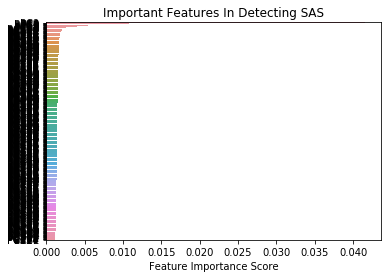

In [8]:
features_index = ["PC" + str(ind) for ind in list(range(1, keep_pc+1))]

features = model.feature_importances_
feature_imp = pd.Series(features,index=features_index).sort_values(
    ascending=False)

%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.title("Important Features In Detecting SAS")
plt.show()

In [9]:
from random import randrange

# Extract single tree
rand = randrange(0, model.n_estimators)
print(f"Tree {rand}")
estimator = model.estimators_[rand]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = features_index,
                class_names = ["SAS", "Neutral"],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

Tree 200


## Test Set Evaluation

Below are peformance measures on the test set never touched during model building

In [10]:
pca = PCA()
X_test_reduced = pca.fit_transform(X_test)[:, :keep_pc]
y_pred = model.predict(X_test_reduced)
print("Accuracy on Test Set:", accuracy_score(y_test,y_pred))
print(f'Our OOB prediction of accuracy is: {model.oob_score_ * 100}%')

# show stats
matrix = pd.crosstab(y_pred, y_test, margins=True)
matrix.index = ['True Yes', 'True No', '']
matrix.columns = ['Pred Yes', 'Pred No', '']
print(matrix)

TP, FN = matrix.iloc[0, 0], matrix.iloc[0, 1]
FP, TN = matrix.iloc[1, 0], matrix.iloc[1, 1]
total = TP + FN + FP + TN
print("Accuracy: \t\t\t\t\t\t\t", (TP + TN) / total)
print("Error Rate: \t\t\t\t\t\t\t", (FN + FP) / total)
print("True Positive Rate (TPR) | Sensitivity | Recall | Coverage\t", 
      TP / (TP + FN))
print("True Negative Rate (TNR) | Specificity \t\t\t\t", 
      TN / (FP + TN))
print("False Positive Rate (FPR) is \t\t\t\t\t", FP / (FP + TN))
print("False Negative Rate (FNR) is \t\t\t\t\t", FN / (TP + FN))
precision = TP / (TP + FP)
recall = TP / (TP + FN)
print("Average Precision: \t\t\t\t\t\t", precision)
print("Average F Measures: \t\t\t\t\t\t", 
      (2*recall*precision) / (recall + precision))
pred_prob = model.predict_proba(X_test_reduced)[:, 1]
print("Average AUC: \t\t\t\t\t\t\t", roc_auc_score(y_test, pred_prob))

Accuracy on Test Set: 0.49130635482381907
Our OOB prediction of accuracy is: 72.67692307692307%
          Pred Yes  Pred No      
True Yes        40       46    86
True No       3260     3153  6413
              3300     3199  6499
Accuracy: 							 0.49130635482381907
Error Rate: 							 0.508693645176181
True Positive Rate (TPR) | Sensitivity | Recall | Coverage	 0.46511627906976744
True Negative Rate (TNR) | Specificity 				 0.4916575705598004
False Positive Rate (FPR) is 					 0.5083424294401996
False Negative Rate (FNR) is 					 0.5348837209302325
Average Precision: 						 0.012121212121212121
Average F Measures: 						 0.02362669816893089
Average AUC: 							 0.4912124527551223


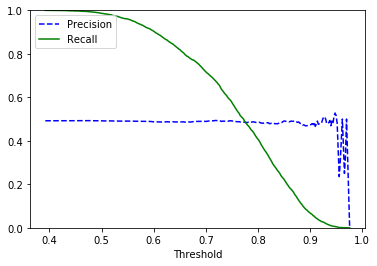

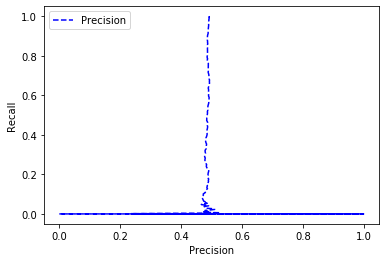

In [11]:
from sklearn.metrics import precision_recall_curve

# precision recall curve for training set 
y_prob = model.predict_proba(X_test_reduced)[:,1]
precisions, recalls, thresholds = precision_recall_curve(
    y_test, y_prob, pos_label = "Yes")

def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])

plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

plt.plot(precisions, recalls, "b--", label="Precision")
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc="upper left")
plt.show()

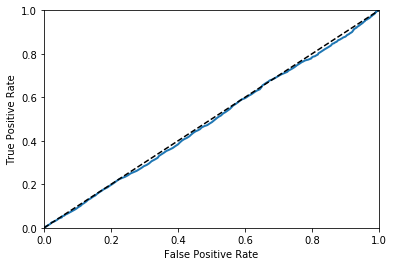

The AUC is  0.4912124527551223


In [12]:
# ROC Curve
# The more the area under the curve the better our classifier
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob, pos_label = "Yes")
def plot_roc_curve(fpr, tpr, label=None):
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([0, 1, 0, 1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')

plot_roc_curve(fpr, tpr, "Random Forest")
plt.show()

from sklearn.metrics import roc_auc_score
print("The AUC is ", roc_auc_score(y_test, y_prob))